# 
<br>
<br>
<br>

# <p><center style="background-color:darkgreen;font-family:Gabriola;color:white;font-size:230%;text-align:center;border-radius:10px 70px;">  🕵️‍♂️ Anomaly Detection in Time Series 🕵️‍♂️  </center></p>

<p><center style="color:darkblue; font-family:cursive;font-size:110%;">___ Regression Algorithms ___ </center></p>
<br>  
<p><center style="color:darkgreen; font-family:cursive;font-size:110%;">Hossein Ahmadi & Sobhan Mohammadi<i>: <a href="https://www.kaggle.com/ahmadihossein">www.kaggle.com/ahmadihossein</a>&nbsp;&nbsp;&nbsp;&nbsp;<a href="https://www.kaggle.com/sobhan1234">www.kaggle.com/sobhan1234</a></i></center></p>



### Project Review: 

Our project delving into **"Anomaly Detection in Time Series"** marks a significant stride at the confluence of sophisticated data analytics and pragmatic problem-solving. Employing cutting-edge techniques in **time series analysis** and **LSTM** architectures, we've crafted a robust framework adept at discerning anomalies within intricate temporal datasets with unparalleled precision and efficacy.

### The primary objectives of our project are two-fold:

**Augmented Data Security**

In an era rife with data breaches and anomalies posing substantial risks to organizations across sectors, our solution offers a proactive stance toward fortifying critical information. By swiftly **identifying anomalies** in time series data, we empower enterprises to preemptively **detect** and **mitigate** potential security breaches, thereby fortifying their data infrastructure and preserving stakeholder **trust**.


**Optimized Operational Efficiency**

Beyond addressing security concerns, our project also addresses the imperative of refining operational efficiency. Through automating the detection of anomalies in time series data, we facilitate businesses in streamlining their decision-making processes and allocating resources more judiciously. This not only bolsters productivity but also minimizes the impact of aberrations on business operations, fostering improved performance and profitability.

In essence, our project on "Anomaly Detection in Time Series" emerges as a groundbreaking solution at the nexus of data analytics and risk mitigation. With its capacity to bolster data security, heighten operational efficiency, and furnish actionable insights, **it stands poised to revolutionize organizational approaches to anomaly detection in the digital landscape**.

### About Dataset
The Numenta Anomaly Benchmark (NAB) is a novel benchmark for evaluating algorithms for anomaly detection in streaming, online applications. It is comprised of over 50 labeled real-world and artificial timeseries data files plus a novel scoring mechanism designed for real-time applications. All of the data and code is fully open-source, with extensive documentation, and a scoreboard of anomaly detection algorithms: github.com/numenta/NAB. The full dataset is included here, but please go to the repo for details on how to evaluate anomaly detection algorithms on NAB.

### The dataset
A collection of Twitter mentions of large **publicly-traded companies**:

Apple,
Amazon,
Salesforce,
CVS,
Facebook,
Google,
IBM,
Coca-Cola,
Pfizer,
UPS.
The metric value represents the number of mentions for a given ticker symbol every 5 minutes.

### Inspirations
##### The data can be used for analysis, anomaly detection or any relevant study!

### Acknowledgments
I want to cite this article:
Lavin, Alexander and Ahmad, Subutai.* "Evaluating Real-time Anomaly Detection Algorithms – the Numenta Anomaly Benchmark"*, Fourteenth International Conference on Machine Learning and Applications, December 2015.

# <p><center style="background-color:darkgreen;font-family:Gabriola;color:white;font-size:230%;text-align:center;border-radius:10px 70px;">🚀 START 🚀</center></p>

# <p><center style="background-color:purple;font-family:Gabriola;color:white;font-size:230%;text-align:center;border-radius:10px 70px;">1️⃣ Importing Libraries and Dataset</center></p>

In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
import xgboost as xgb
import lightgbm as lgb
import plotly.express as px
from sklearn.svm import SVR
from sklearn.svm import NuSVR
import matplotlib.pyplot as plt
import plotly.graph_objects as go
from sklearn.svm import LinearSVR
from lightgbm import LGBMRegressor
from sklearn.svm import OneClassSVM
from catboost import CatBoostRegressor
from sklearn.ensemble import IsolationForest
from sklearn.ensemble import BaggingRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.linear_model import BayesianRidge
from sklearn.tree import DecisionTreeRegressor
from sklearn.neural_network import MLPRegressor
from sklearn.covariance import EllipticEnvelope
from sklearn.ensemble import ExtraTreesRegressor
from sklearn.ensemble import ExtraTreesRegressor
from sklearn.model_selection import GridSearchCV
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import classification_report
from sklearn.neighbors import KNeighborsRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import cross_val_score
from bokeh.plotting import figure, output_file, show
from sklearn.model_selection import train_test_split
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.linear_model import OrthogonalMatchingPursuit
from sklearn.gaussian_process import GaussianProcessRegressor
from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error, accuracy_score
from sklearn.linear_model import LinearRegression, Ridge, Lasso, ElasticNet, HuberRegressor, PassiveAggressiveRegressor, Lars
from sklearn.ensemble import RandomForestRegressor, ExtraTreesRegressor, GradientBoostingRegressor, BaggingRegressor, AdaBoostRegressor

In [2]:
import warnings
# Suppress future warning for use_inf_as_na
warnings.simplefilter(action='ignore', category=FutureWarning)

In [3]:
# Load the dataset
df = pd.read_csv("/kaggle/input/twitter-mentions-volumes/dataset.csv")

In [4]:
df

,timestamp,Apple,Amazon,Salesforce,CVS,Facebook,Google,IBM,Coca-Cola,Pfizer,UPS
0,2015-02-26 21:42:53,104,57.0,11,0.0,53.0,35.0,7.0,8.0,3.0,2.0
1,2015-02-26 21:47:53,100,43.0,10,0.0,64.0,41.0,4.0,8.0,2.0,2.0
2,2015-02-26 21:52:53,99,55.0,3,0.0,49.0,32.0,14.0,5.0,2.0,4.0
3,2015-02-26 21:57:53,154,64.0,4,0.0,48.0,36.0,6.0,13.0,36.0,3.0
4,2015-02-26 22:02:53,120,93.0,9,0.0,22.0,32.0,1.0,22.0,8.0,5.0
...,...,...,...,...,...,...,...,...,...,...,...
15897,2015-04-23 02:27:53,44,NaN,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN
15898,2015-04-23 02:32:53,45,NaN,4,NaN,NaN,NaN,NaN,NaN,NaN,NaN
15899,2015-04-23 02:37:53,48,NaN,3,NaN,NaN,NaN,NaN,NaN,NaN,NaN
15900,2015-04-23 02:42:53,26,NaN,8,NaN,NaN,NaN,NaN,NaN,NaN,NaN


# <p><center style="background-color:purple;font-family:Gabriola;color:white;font-size:230%;text-align:center;border-radius:10px 70px;">2️⃣ PreProcessing</center></p>

In [5]:
# Convert timestamp column to datetime format
df['timestamp'] = pd.to_datetime(df['timestamp'])

In [6]:
# Display the first few rows of the dataset
df.head()

,timestamp,Apple,Amazon,Salesforce,CVS,Facebook,Google,IBM,Coca-Cola,Pfizer,UPS
0,2015-02-26 21:42:53,104,57.0,11,0.0,53.0,35.0,7.0,8.0,3.0,2.0
1,2015-02-26 21:47:53,100,43.0,10,0.0,64.0,41.0,4.0,8.0,2.0,2.0
2,2015-02-26 21:52:53,99,55.0,3,0.0,49.0,32.0,14.0,5.0,2.0,4.0
3,2015-02-26 21:57:53,154,64.0,4,0.0,48.0,36.0,6.0,13.0,36.0,3.0
4,2015-02-26 22:02:53,120,93.0,9,0.0,22.0,32.0,1.0,22.0,8.0,5.0


In [7]:
# Check for missing values
missing_values = df.isnull().sum()
print("\nMissing values in the dataset:")
print(missing_values)


Missing values in the dataset:
timestamp      0
Apple          0
Amazon        71
Salesforce     0
CVS           49
Facebook      69
Google        60
IBM            9
Coca-Cola     51
Pfizer        44
UPS           36
dtype: int64


In [8]:
# Handle missing values
df.fillna(df.mean(), inplace=True)

In [9]:
df

,timestamp,Apple,Amazon,Salesforce,CVS,Facebook,Google,IBM,Coca-Cola,Pfizer,UPS
0,2015-02-26 21:42:53,104,57.000000,11,0.000000,53.00000,35.000000,7.000000,8.000000,3.000000,2.000000
1,2015-02-26 21:47:53,100,43.000000,10,0.000000,64.00000,41.000000,4.000000,8.000000,2.000000,2.000000
2,2015-02-26 21:52:53,99,55.000000,3,0.000000,49.00000,32.000000,14.000000,5.000000,2.000000,4.000000
3,2015-02-26 21:57:53,154,64.000000,4,0.000000,48.00000,36.000000,6.000000,13.000000,36.000000,3.000000
4,2015-02-26 22:02:53,120,93.000000,9,0.000000,22.00000,32.000000,1.000000,22.000000,8.000000,5.000000
...,...,...,...,...,...,...,...,...,...,...,...
15897,2015-04-23 02:27:53,44,53.298465,1,0.359616,17.81128,20.736397,4.390235,11.397262,0.866566,5.456322
15898,2015-04-23 02:32:53,45,53.298465,4,0.359616,17.81128,20.736397,4.390235,11.397262,0.866566,5.456322
15899,2015-04-23 02:37:53,48,53.298465,3,0.359616,17.81128,20.736397,4.390235,11.397262,0.866566,5.456322
15900,2015-04-23 02:42:53,26,53.298465,8,0.359616,17.81128,20.736397,4.390235,11.397262,0.866566,5.456322


In [10]:
# Check for missing values
missing_values = df.isnull().sum()
print("\nMissing values in the dataset:")
print(missing_values)


Missing values in the dataset:
timestamp     0
Apple         0
Amazon        0
Salesforce    0
CVS           0
Facebook      0
Google        0
IBM           0
Coca-Cola     0
Pfizer        0
UPS           0
dtype: int64


In [11]:
# Import the MinMaxScaler
from sklearn.preprocessing import MinMaxScaler

# Normalize the numerical columns using MinMaxScaler
scaler = MinMaxScaler()
numerical_columns = df.columns[1:]  # Exclude the timestamp column
df[numerical_columns] = scaler.fit_transform(df[numerical_columns])

In [12]:
df[numerical_columns]

,Apple,Amazon,Salesforce,CVS,Facebook,Google,IBM,Coca-Cola,Pfizer,UPS
0,0.007716,0.034071,0.052632,0.000000,0.042130,0.075269,0.050360,0.003570,0.083333,0.008658
1,0.007419,0.025702,0.047847,0.000000,0.050874,0.088172,0.028777,0.003570,0.055556,0.008658
2,0.007345,0.032875,0.014354,0.000000,0.038951,0.068817,0.100719,0.002231,0.055556,0.017316
3,0.011425,0.038255,0.019139,0.000000,0.038156,0.077419,0.043165,0.005801,1.000000,0.012987
4,0.008903,0.055589,0.043062,0.000000,0.017488,0.068817,0.007194,0.009817,0.222222,0.021645
...,...,...,...,...,...,...,...,...,...,...
15897,0.003264,0.031858,0.004785,0.007192,0.014158,0.044594,0.031584,0.005086,0.024071,0.023620
15898,0.003339,0.031858,0.019139,0.007192,0.014158,0.044594,0.031584,0.005086,0.024071,0.023620
15899,0.003561,0.031858,0.014354,0.007192,0.014158,0.044594,0.031584,0.005086,0.024071,0.023620
15900,0.001929,0.031858,0.038278,0.007192,0.014158,0.044594,0.031584,0.005086,0.024071,0.023620


In [13]:
# Display the first few rows of the preprocessed dataset
df.head()

,timestamp,Apple,Amazon,Salesforce,CVS,Facebook,Google,IBM,Coca-Cola,Pfizer,UPS
0,2015-02-26 21:42:53,0.007716,0.034071,0.052632,0.0,0.042130,0.075269,0.050360,0.003570,0.083333,0.008658
1,2015-02-26 21:47:53,0.007419,0.025702,0.047847,0.0,0.050874,0.088172,0.028777,0.003570,0.055556,0.008658
2,2015-02-26 21:52:53,0.007345,0.032875,0.014354,0.0,0.038951,0.068817,0.100719,0.002231,0.055556,0.017316
3,2015-02-26 21:57:53,0.011425,0.038255,0.019139,0.0,0.038156,0.077419,0.043165,0.005801,1.000000,0.012987
4,2015-02-26 22:02:53,0.008903,0.055589,0.043062,0.0,0.017488,0.068817,0.007194,0.009817,0.222222,0.021645


In [14]:
# Save the preprocessed dataset 
df.to_csv("preprocessed_twitter_data.csv", index=False)

In [15]:
# Verify Timestamp Column
print("\nData types of each column:")
df.dtypes


Data types of each column:


timestamp     datetime64[ns]
Apple                float64
Amazon               float64
Salesforce           float64
CVS                  float64
Facebook             float64
Google               float64
IBM                  float64
Coca-Cola            float64
Pfizer               float64
UPS                  float64
dtype: object

In [16]:
# Check Normalization
print(df.describe())

                           timestamp         Apple        Amazon  \
count                          15902  15902.000000  15902.000000   
mean   2015-03-26 12:15:22.999999744      0.006347      0.031858   
min              2015-02-26 21:42:53      0.000000      0.000000   
25%              2015-03-12 16:59:08      0.002151      0.021518   
50%              2015-03-26 12:15:23      0.003487      0.029886   
75%              2015-04-09 07:31:38      0.005638      0.038852   
max              2015-04-23 02:47:53      1.000000      1.000000   
std                              NaN      0.023819      0.018222   

         Salesforce           CVS      Facebook        Google           IBM  \
count  15902.000000  15902.000000  15902.000000  15902.000000  15902.000000   
mean       0.016025      0.007192      0.014158      0.044594      0.031584   
min        0.000000      0.000000      0.000000      0.000000      0.000000   
25%        0.004785      0.000000      0.007154      0.023656      0.00

In [17]:
print(df.isnull().sum())

timestamp     0
Apple         0
Amazon        0
Salesforce    0
CVS           0
Facebook      0
Google        0
IBM           0
Coca-Cola     0
Pfizer        0
UPS           0
dtype: int64


##### ✅ it appears that there are no NaN values in the standard deviation (std) row. 
##### The values are present for all columns, indicating that the standard deviation has been calculated successfully for each numeric feature. 
##### Therefore, there was likely a misunderstanding or oversight in the initial observation regarding NaN values in the std row.

In [18]:
print(df['timestamp'].describe())

count                            15902
mean     2015-03-26 12:15:22.999999744
min                2015-02-26 21:42:53
25%                2015-03-12 16:59:08
50%                2015-03-26 12:15:23
75%                2015-04-09 07:31:38
max                2015-04-23 02:47:53
Name: timestamp, dtype: object


In [19]:
# Check Data Range
df.aggregate(['min', 'mean', 'max'])

,timestamp,Apple,Amazon,Salesforce,CVS,Facebook,Google,IBM,Coca-Cola,Pfizer,UPS
min,2015-02-26 21:42:53.000000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000
mean,2015-03-26 12:15:22.999999744,0.006347,0.031858,0.016025,0.007192,0.014158,0.044594,0.031584,0.005086,0.024071,0.02362
max,2015-04-23 02:47:53.000000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.00000


### 📊 The outputs seem reasonable.

### ✅ Overall:

### In this step we have focused on handling missing values, normalizing numerical columns, and 

### verifying the integrity of the dataset before further analysis.

# <p><center style="background-color:purple;font-family:Gabriola;color:white;font-size:230%;text-align:center;border-radius:10px 70px;">3️⃣ Exploratory Data Analysis (EDA)</center></p>

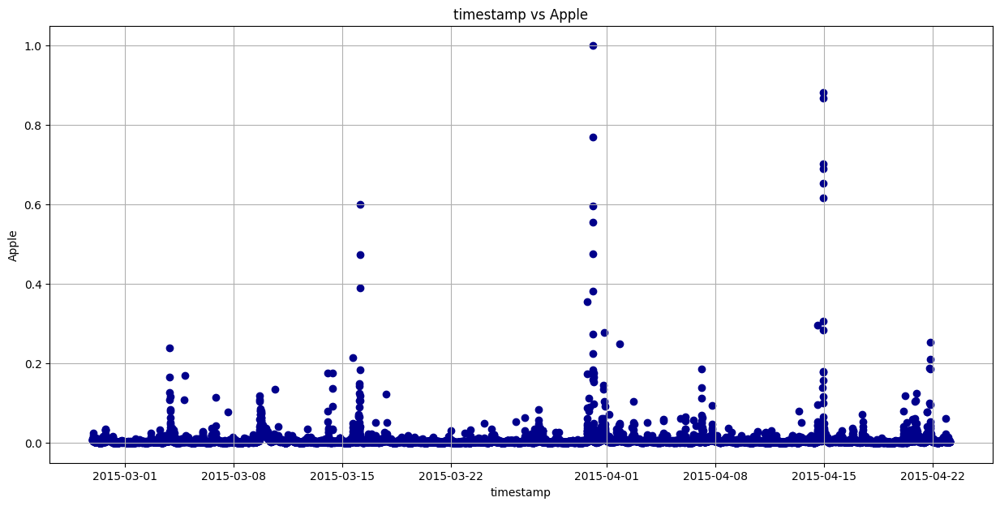

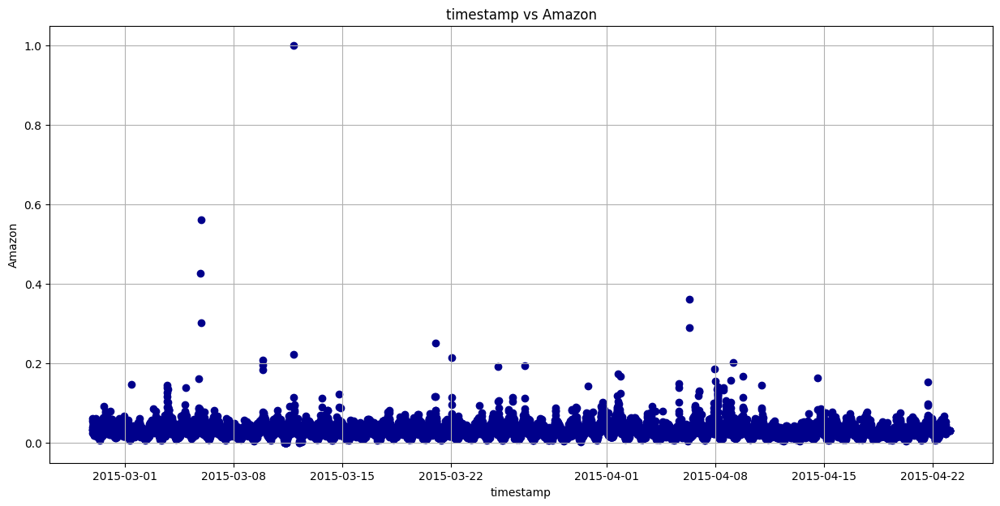

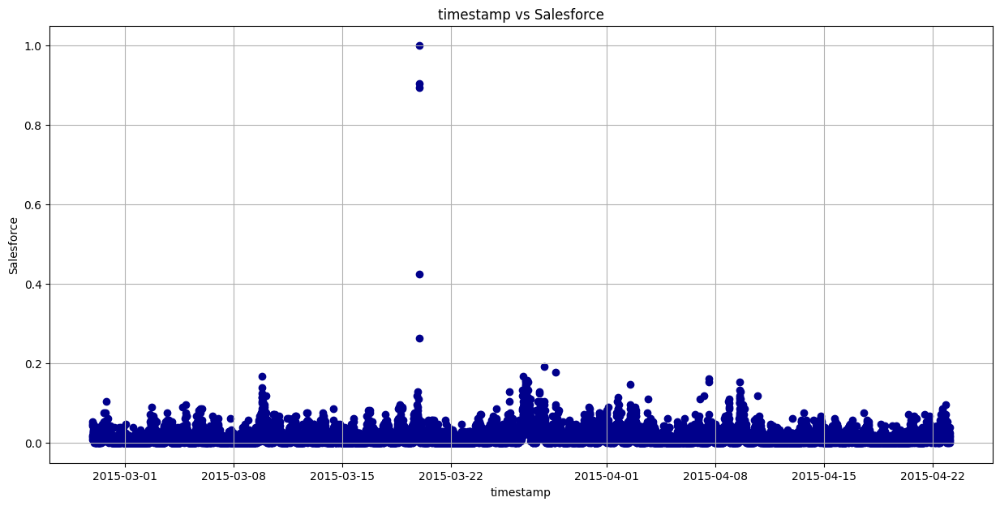

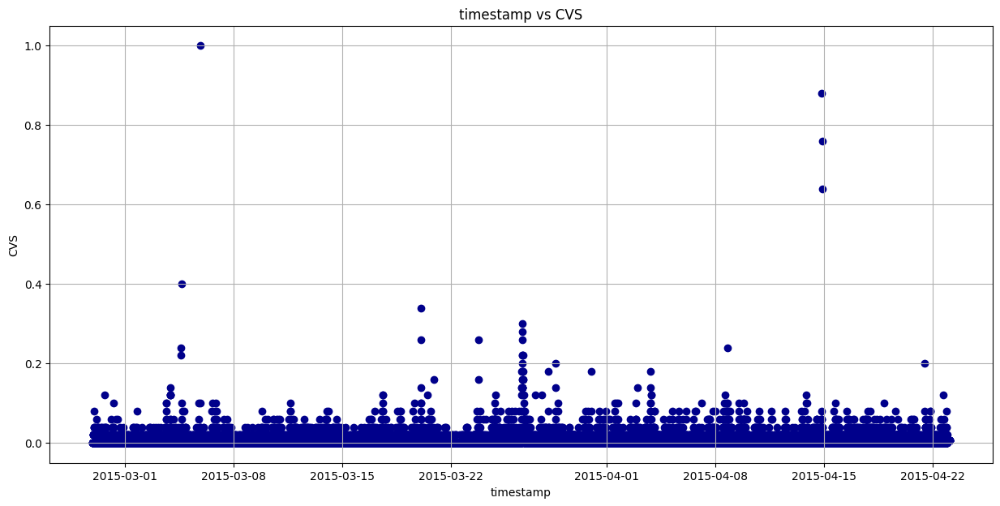

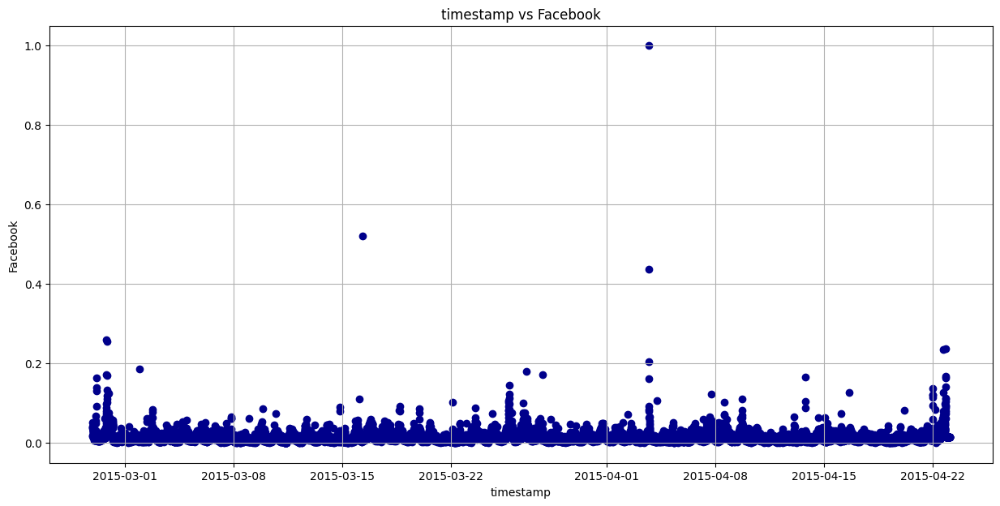

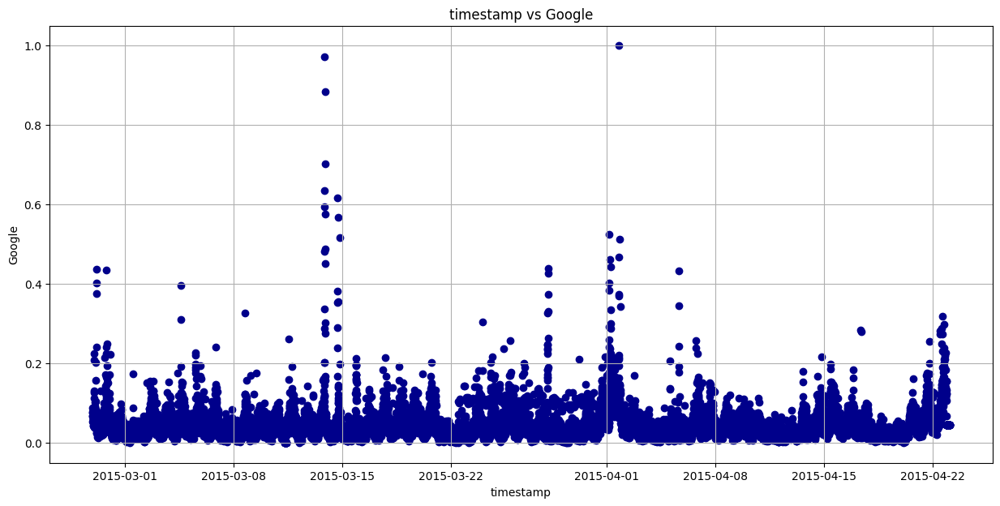

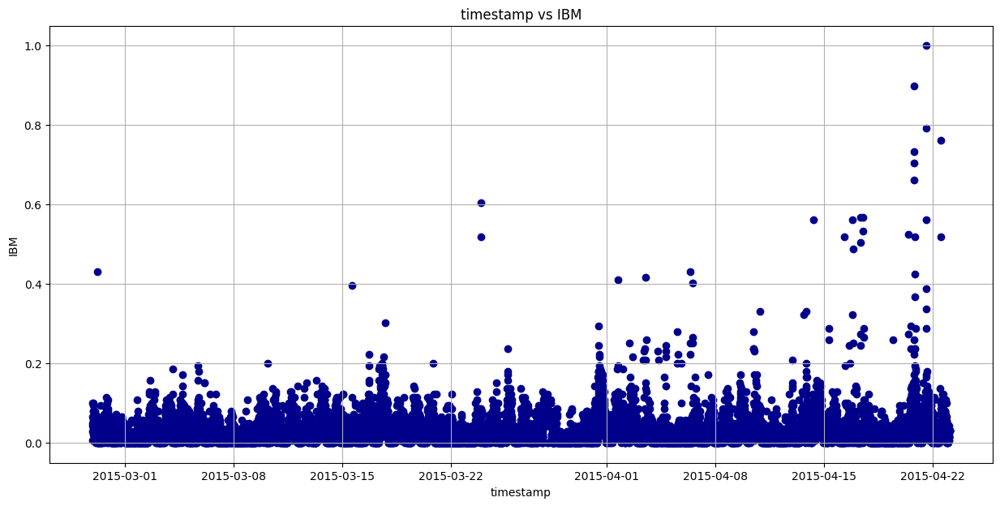

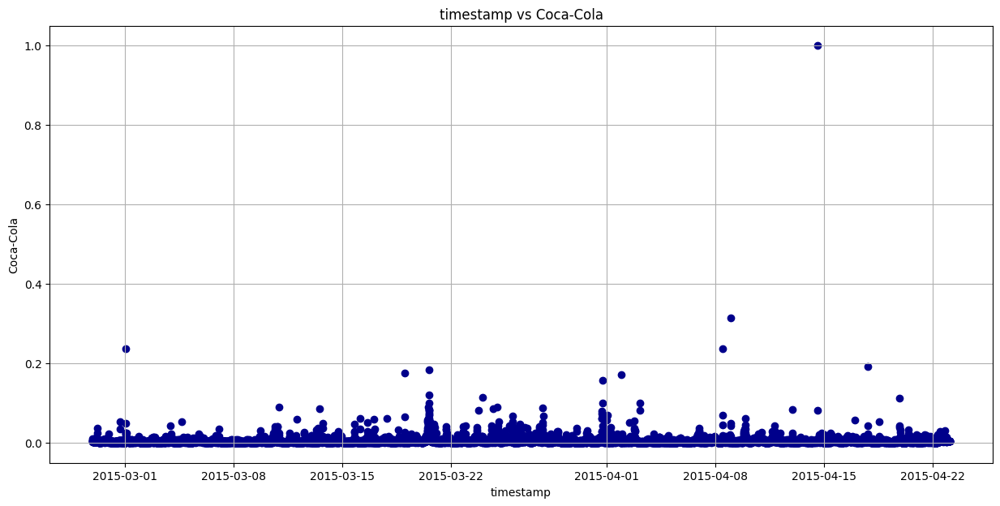

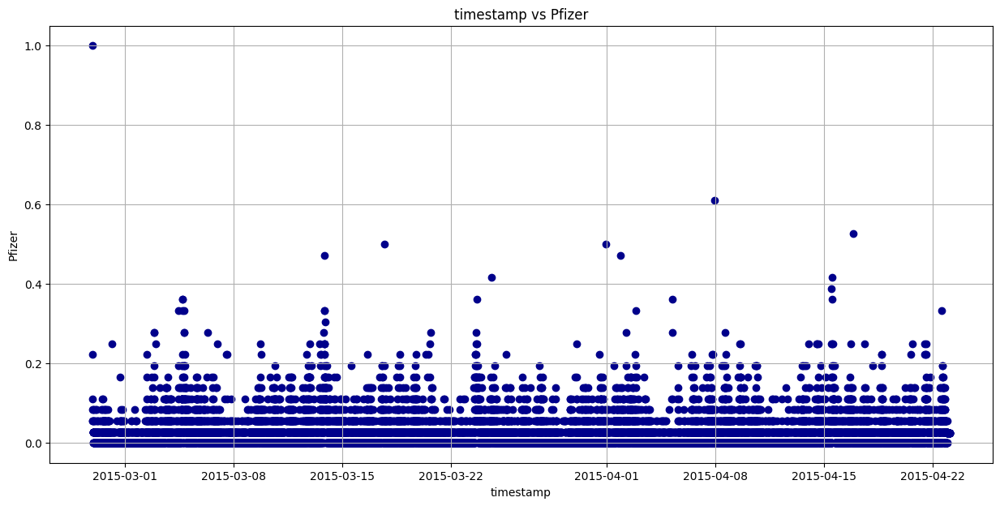

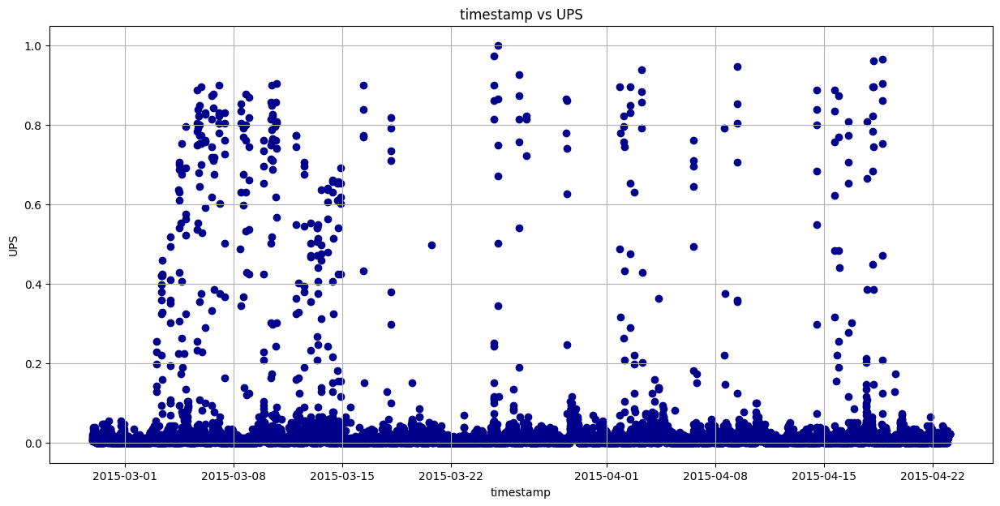

In [20]:
# Check if 'timestamp' column exists in the DataFrame
if 'timestamp' in df.columns:
    # Extracting column names from the DataFrame
    columns = df.columns.tolist()
    # Excluding 'timestamp' column from the list
    columns.remove('timestamp')
    # Plotting each column against 'timestamp' using a loop
    for col in columns:
        plt.figure(figsize=(15, 7))
        plt.scatter(df['timestamp'], df[col], color='darkblue')
        plt.title(f'timestamp vs {col}')
        plt.xlabel('timestamp')
        plt.ylabel(col)
        plt.grid(True)
        plt.show()
else:
    print("The 'timestamp' column does not exist in the DataFrame.")

In [21]:
# Create an area plot for each column against the 'timestamp' column
fig = px.line(df, x='timestamp', y=df.columns[1:], facet_col_wrap=2, facet_col='variable')
# Update axis labels and title
fig.update_layout(
    xaxis_title="Timestamp",
    yaxis_title="Value",
    title="Value vs Timestamp for Each Column",
)
# Show the plot
fig.show()

In [22]:
# Create a new Figure
fig = go.Figure()
# Add traces for each column vs timestamp
for col in df.columns[1:]:  # Exclude 'timestamp' column
    fig.add_trace(go.Scatter(
        name=col,
        mode="markers+lines",
        x=df["timestamp"],
        y=df[col]
    ))
# Update x-axis settings
fig.update_xaxes(showgrid=True, ticklabelmode="period")
# Show the plot
fig.show()

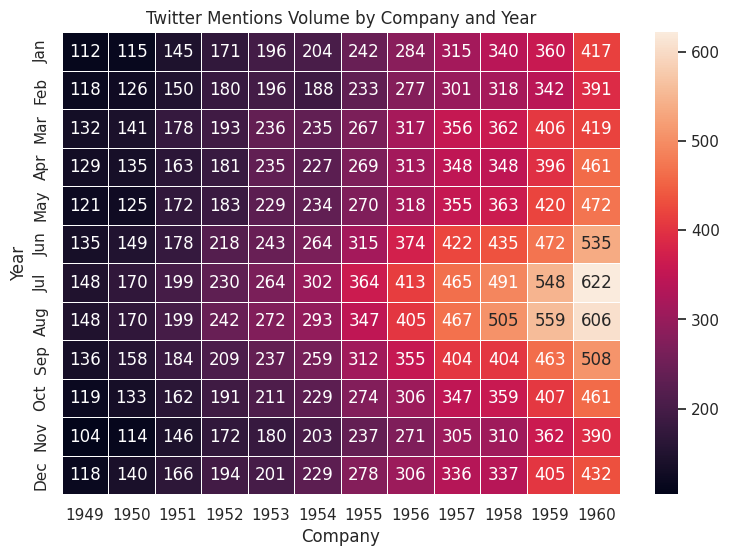

In [23]:
# Set the theme for seaborn
sns.set_theme()
# Load the example flights dataset and convert to long-form
flights_long = sns.load_dataset("flights")
# Pivot the dataset to create a matrix where rows represent months, columns represent years, and values represent passengers
flights = flights_long.pivot(index="month", columns="year", values="passengers")
# Create a heatmap with the numeric values in each cell
fig, ax = plt.subplots(figsize=(9, 6))
heatmap = sns.heatmap(flights, annot=True, fmt="d", linewidths=.5, ax=ax)
# Set labels for x and y axis
heatmap.set_xlabel('Company')
heatmap.set_ylabel('Year')
# Set title for the plot
heatmap.set_title('Twitter Mentions Volume by Company and Year')
# Show the plot
plt.show()

# <p><center style="background-color:purple;font-family:Gabriola;color:white;font-size:230%;text-align:center;border-radius:10px 70px;">4️⃣ Feature Engineering</center></p>

In [24]:
# Date-Time Features
df['day_of_week'] = df['timestamp'].dt.dayofweek
df['month'] = df['timestamp'].dt.month
df['quarter'] = df['timestamp'].dt.quarter
df['year'] = df['timestamp'].dt.year

In [25]:
# Lag Features
lag_periods = [1, 3, 6]  # Lag periods to consider
for period in lag_periods:
    df[f'lag_{period}_mentions'] = df['Apple'].shift(periods=period)

In [26]:
# Moving Averages
window_sizes = [3, 6, 9]  # Window sizes for moving averages
for window_size in window_sizes:
    df[f'moving_avg_{window_size}_mentions'] = df['Apple'].rolling(window=window_size).mean()

In [27]:
# Relative Performance
benchmark = df[['Amazon', 'Google']].mean(axis=1)  # Using the mean of Amazon and Google as benchmark
df['relative_performance'] = df['Apple'] / benchmark - 1

In [28]:
# Seasonality Indicators
df['month_sin'] = np.sin(2 * np.pi * df['month'] / 12)
df['month_cos'] = np.cos(2 * np.pi * df['month'] / 12)

In [29]:
# Display the updated DataFrame
print(df.head())

            timestamp     Apple    Amazon  Salesforce  CVS  Facebook  \
0 2015-02-26 21:42:53  0.007716  0.034071    0.052632  0.0  0.042130   
1 2015-02-26 21:47:53  0.007419  0.025702    0.047847  0.0  0.050874   
2 2015-02-26 21:52:53  0.007345  0.032875    0.014354  0.0  0.038951   
3 2015-02-26 21:57:53  0.011425  0.038255    0.019139  0.0  0.038156   
4 2015-02-26 22:02:53  0.008903  0.055589    0.043062  0.0  0.017488   

     Google       IBM  Coca-Cola    Pfizer  ...  year  lag_1_mentions  \
0  0.075269  0.050360   0.003570  0.083333  ...  2015             NaN   
1  0.088172  0.028777   0.003570  0.055556  ...  2015        0.007716   
2  0.068817  0.100719   0.002231  0.055556  ...  2015        0.007419   
3  0.077419  0.043165   0.005801  1.000000  ...  2015        0.007345   
4  0.068817  0.007194   0.009817  0.222222  ...  2015        0.011425   

   lag_3_mentions  lag_6_mentions  moving_avg_3_mentions  \
0             NaN             NaN                    NaN   
1       

In [30]:
# Drop rows with NaN values
df.dropna(inplace=True)

# Display the updated DataFrame
print(df.head())

             timestamp     Apple    Amazon  Salesforce   CVS  Facebook  \
8  2015-02-26 22:22:53  0.025150  0.034071    0.023923  0.00  0.018283   
9  2015-02-26 22:27:53  0.013206  0.040646    0.047847  0.02  0.031002   
10 2015-02-26 22:32:53  0.010683  0.038255    0.019139  0.02  0.020668   
11 2015-02-26 22:37:53  0.010609  0.036461    0.028708  0.00  0.026232   
12 2015-02-26 22:42:53  0.013280  0.043634    0.028708  0.02  0.040541   

      Google       IBM  Coca-Cola    Pfizer  ...  year  lag_1_mentions  \
8   0.081720  0.064748   0.004462  0.055556  ...  2015        0.005267   
9   0.060215  0.100719   0.005801  0.000000  ...  2015        0.025150   
10  0.060215  0.050360   0.002677  0.027778  ...  2015        0.013206   
11  0.058065  0.043165   0.004462  0.027778  ...  2015        0.010683   
12  0.064516  0.043165   0.007586  0.027778  ...  2015        0.010609   

    lag_3_mentions  lag_6_mentions  moving_avg_3_mentions  \
8         0.006677        0.007345               

### ✅ After applying the feature engineering:
##### 1- New columns were created to capture information such as the day of the week, month, quarter, and year from the timestamp column.

##### 2- New columns were created to represent the mentions volume of each company in the previous months (lag periods).

##### 3- New columns were created to calculate the moving averages of the mentions volume for each company over specified window sizes.

##### 4- A new column was created to measure the relative performance of the Apple company compared to a benchmark (mean mentions volume of Amazon and Google).

##### 5- New columns were created to encode the cyclic features of month using sine and cosine transformations, capturing any seasonal patterns in the mentions volume.

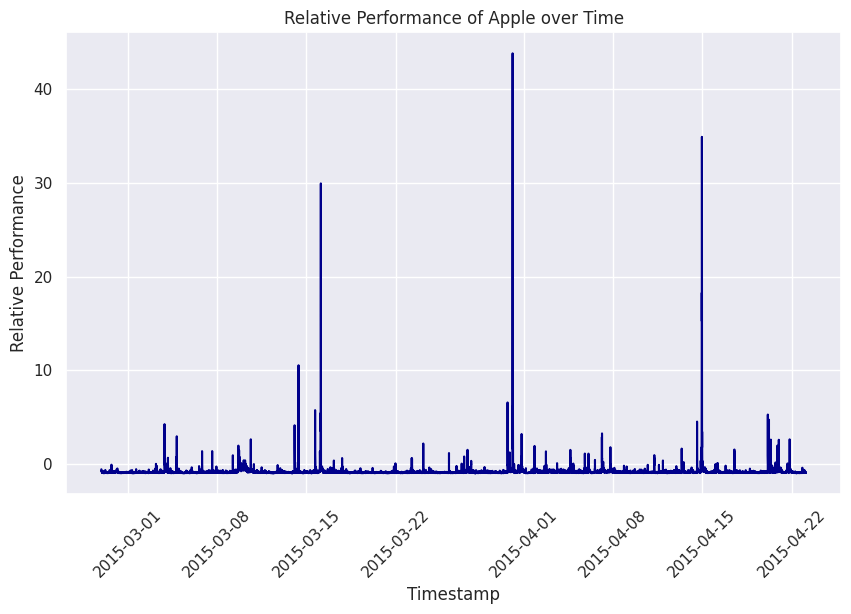

In [31]:
plt.figure(figsize=(10, 6))
sns.lineplot(x='timestamp', y='relative_performance', data=df, color='darkblue')
plt.title('Relative Performance of Apple over Time')
plt.xlabel('Timestamp')
plt.ylabel('Relative Performance')
plt.xticks(rotation=45)
plt.show()

In [32]:
# Convert timestamp column to datetime format
df['timestamp'] = pd.to_datetime(df['timestamp'])

# Extract month from timestamp
df['month'] = df['timestamp'].dt.month

# Calculate month_sin and month_cos
df['month_sin'] = np.sin(2 * np.pi * df['month'] / 12)
df['month_cos'] = np.cos(2 * np.pi * df['month'] / 12)

# Display the first few rows of the DataFrame
print(df[['timestamp', 'month', 'month_sin', 'month_cos']].head())

             timestamp  month  month_sin  month_cos
8  2015-02-26 22:22:53      2   0.866025        0.5
9  2015-02-26 22:27:53      2   0.866025        0.5
10 2015-02-26 22:32:53      2   0.866025        0.5
11 2015-02-26 22:37:53      2   0.866025        0.5
12 2015-02-26 22:42:53      2   0.866025        0.5


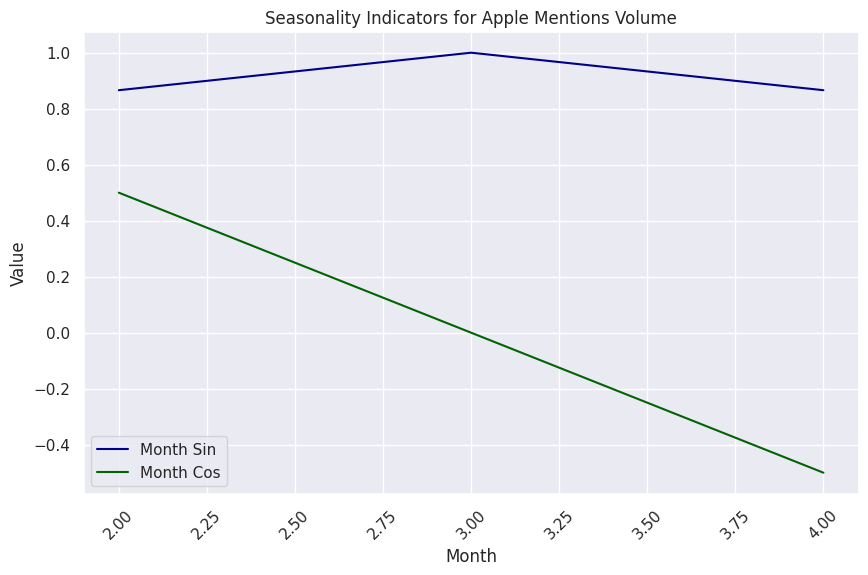

In [33]:
# Plot the 'month_sin' and 'month_cos' features against month
plt.figure(figsize=(10, 6))
plt.plot(df['month'], df['month_sin'], color='darkblue', label='Month Sin')
plt.plot(df['month'], df['month_cos'], color='darkgreen', label='Month Cos')
plt.title('Seasonality Indicators for Apple Mentions Volume')
plt.xlabel('Month')
plt.ylabel('Value')
plt.legend()
plt.xticks(rotation=45)
plt.show()

##### This chart information is valuable for understanding how external factors or internal dynamics impact the dataset's behavior. 
##### Understanding the cyclic patterns allows for more accurate forecasting of future trends and fluctuations.

### 🏁 Conclusion:
##### Overall, the purpose of these codes and processes is to enrich the dataset with relevant features that capture temporal patterns, historical dependencies, relative performance metrics, and seasonal variations. These engineered features lay the groundwork for more accurate analysis and forecasting of trends in the data, ultimately aiding in decision-making processes.

### The metrics used in the feature engineering process serve various purposes in analyzing and understanding the dataset. Here's a breakdown of each metric and its purpose:

### 1- Date-Time Features:

##### Metrics: day_of_week, month, quarter, year
##### Purpose: These metrics extract temporal information from the timestamp column, allowing for analysis based on the day of the week, month, quarter, and year. This helps in understanding if there are any temporal patterns or trends in the data.

### 2- Lag Features:

##### Metrics: lag_{period}_mentions (e.g., lag_1_mentions, lag_3_mentions, lag_6_mentions)
##### Purpose: These metrics represent the mentions volume of each company in the previous months (lag periods). They help capture any lagged effects or dependencies in the data.

### 3- Moving Averages:

##### Metrics: moving_avg_{window_size}_mentions (e.g., moving_avg_3_mentions, moving_avg_6_mentions, moving_avg_9_mentions)
##### Purpose: These metrics calculate the moving averages of the mentions volume for each company over specified window sizes. They help smooth out fluctuations and highlight underlying trends in the data.

### 4- Relative Performance:

##### Metric: relative_performance
##### Purpose: This metric measures the relative performance of the Apple company compared to a benchmark (mean mentions volume of Amazon and Google). It provides insights into how Apple's mentions volume compares to its peers.

### 5- Seasonality Indicators:

##### Metrics: month_sin, month_cos
##### Purpose: These metrics encode the cyclic features of the month using sine and cosine transformations. They capture any seasonal patterns in the mentions volume, allowing for better understanding and forecasting of seasonal fluctuations.
##### Each of these metrics serves a specific purpose in understanding and analyzing the dataset, ranging from capturing temporal patterns to identifying seasonal trends and dependencies.

# <p><center style="background-color:purple;font-family:Gabriola;color:white;font-size:230%;text-align:center;border-radius:10px 70px;">5️⃣ Model Selection</center></p>

In [34]:
# Select features for training
features = ['day_of_week', 'month', 'quarter', 'year', 'lag_1_mentions', 'lag_3_mentions', 'lag_6_mentions',
            'moving_avg_3_mentions', 'moving_avg_6_mentions', 'moving_avg_9_mentions', 'relative_performance',
            'month_sin', 'month_cos']

In [35]:
# Define models
models = {
    "Isolation Forest": IsolationForest(contamination=0.1),
    "One-Class SVM": OneClassSVM(nu=0.1),
    "Elliptic Envelope": EllipticEnvelope(contamination=0.1)
}

In [36]:
# Split data into training and testing sets
train_size = int(0.8 * len(df))
train_data = df[:train_size]
test_data = df[train_size:]

In [37]:
# Impute missing values with mean
train_data.fillna(train_data.mean(), inplace=True)
test_data.fillna(test_data.mean(), inplace=True)

/tmp/ipykernel_18/3147660882.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/tmp/ipykernel_18/3147660882.py:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [38]:
print("Summary statistics of the dataset:")
print(df.describe())

Summary statistics of the dataset:
                           timestamp         Apple        Amazon  \
count                          15867  15867.000000  15867.000000   
mean   2015-03-26 13:12:31.029873408      0.006357      0.031906   
min              2015-02-26 22:22:53      0.000000      0.000000   
25%              2015-03-12 19:10:23      0.002151      0.021518   
50%              2015-03-26 13:42:53      0.003487      0.029886   
75%              2015-04-09 08:15:23      0.005638      0.038852   
max              2015-04-23 02:47:53      1.000000      1.000000   
std                              NaN      0.023843      0.018190   

         Salesforce           CVS      Facebook        Google           IBM  \
count  15867.000000  15867.000000  15867.000000  15867.000000  15867.000000   
mean       0.016046      0.007208      0.014174      0.044658      0.031627   
min        0.000000      0.000000      0.000000      0.000000      0.000000   
25%        0.004785      0.000000   

In [39]:
print("\nMaximum values of engineered features:")
print(df.max())


Maximum values of engineered features:
timestamp                2015-04-23 02:47:53
Apple                                    1.0
Amazon                                   1.0
Salesforce                               1.0
CVS                                      1.0
Facebook                                 1.0
Google                                   1.0
IBM                                      1.0
Coca-Cola                                1.0
Pfizer                              0.611111
UPS                                      1.0
day_of_week                                6
month                                      4
quarter                                    2
year                                    2015
lag_1_mentions                           1.0
lag_3_mentions                           1.0
lag_6_mentions                           1.0
moving_avg_3_mentions               0.813685
moving_avg_6_mentions               0.735403
moving_avg_9_mentions               0.575743
relative_perfor

In [40]:
# Define the maximum value to clip
max_clip_value = 10  

# Identify numerical columns
numerical_columns = df.select_dtypes(include=[np.number]).columns

# Clip numerical columns
df_clipped = df.copy()
df_clipped[numerical_columns] = df_clipped[numerical_columns].clip(upper=max_clip_value)

In [41]:
print("\nData scaling range:")
print("Minimum:", df.min())
print("Maximum:", df.max())


Data scaling range:
Minimum: timestamp                2015-02-26 22:22:53
Apple                                    0.0
Amazon                                   0.0
Salesforce                               0.0
CVS                                      0.0
Facebook                                 0.0
Google                                   0.0
IBM                                      0.0
Coca-Cola                                0.0
Pfizer                                   0.0
UPS                                      0.0
day_of_week                                0
month                                      2
quarter                                    1
year                                    2015
lag_1_mentions                           0.0
lag_3_mentions                           0.0
lag_6_mentions                           0.0
moving_avg_3_mentions               0.000025
moving_avg_6_mentions               0.000148
moving_avg_9_mentions               0.000099
relative_performance     

In [42]:
# Check Data Range
df.aggregate(['min', 'mean', 'max'])

,timestamp,Apple,Amazon,Salesforce,CVS,Facebook,Google,IBM,Coca-Cola,Pfizer,...,year,lag_1_mentions,lag_3_mentions,lag_6_mentions,moving_avg_3_mentions,moving_avg_6_mentions,moving_avg_9_mentions,relative_performance,month_sin,month_cos
min,2015-02-26 22:22:53.000000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,2015.0,0.000000,0.000000,0.000000,0.000025,0.000148,0.000099,-1.000000,0.866025,-0.50000
mean,2015-03-26 13:12:31.029873408,0.006357,0.031906,0.016046,0.007208,0.014174,0.044658,0.031627,0.005094,0.024021,...,2015.0,0.006357,0.006358,0.006358,0.006357,0.006358,0.006358,-0.815798,0.941182,-0.18195
max,2015-04-23 02:47:53.000000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.611111,...,2015.0,1.000000,1.000000,1.000000,0.813685,0.735403,0.575743,43.860306,1.000000,0.50000


In [43]:
# Step 1: Check for NaN or infinity values
nan_columns = df.columns[df.isna().any()].tolist()
inf_columns = df.columns[np.isinf(df).any()].tolist()
if nan_columns:
    print("Columns with NaN values:", nan_columns)
    # Replace NaN values with mean or median
    df.fillna(df.mean(), inplace=True)
if inf_columns:
    print("Columns with infinity values:", inf_columns)
    # Replace infinity values with a suitable replacement, such as the mean or median of the column
    df.replace([np.inf, -np.inf], np.nan, inplace=True)
    df.fillna(df.mean(), inplace=True)
# Step 2: Inspect the original dataset
# Review the dataset visually or print summary statistics
print(df.describe())

                           timestamp         Apple        Amazon  \
count                          15867  15867.000000  15867.000000   
mean   2015-03-26 13:12:31.029873408      0.006357      0.031906   
min              2015-02-26 22:22:53      0.000000      0.000000   
25%              2015-03-12 19:10:23      0.002151      0.021518   
50%              2015-03-26 13:42:53      0.003487      0.029886   
75%              2015-04-09 08:15:23      0.005638      0.038852   
max              2015-04-23 02:47:53      1.000000      1.000000   
std                              NaN      0.023843      0.018190   

         Salesforce           CVS      Facebook        Google           IBM  \
count  15867.000000  15867.000000  15867.000000  15867.000000  15867.000000   
mean       0.016046      0.007208      0.014174      0.044658      0.031627   
min        0.000000      0.000000      0.000000      0.000000      0.000000   
25%        0.004785      0.000000      0.007154      0.023656      0.00

In [44]:
# Step 1: Check for NaN or infinity values
nan_columns = df.columns[df.isna().any()].tolist()
inf_columns = df.columns[np.isinf(df).any()].tolist()
if nan_columns:
    print("Columns with NaN values:", nan_columns)
    # Replace NaN values with mean or median
    df.fillna(df.mean(), inplace=True)
if inf_columns:
    print("Columns with infinity values:", inf_columns)
    # Replace infinity values with a suitable replacement, such as the mean or median of the column
    for col in inf_columns:
        df[col] = np.where(np.isinf(df[col]), df[col].replace([np.inf, -np.inf], np.nan).mean(), df[col])
# Check if there are still infinity values after replacement
inf_columns_after_replace = df.columns[np.isinf(df).any()].tolist()
if not inf_columns_after_replace:
    print("Infinity values have been replaced successfully.")
else:
    print("Unable to replace infinity values for columns:", inf_columns_after_replace)

Infinity values have been replaced successfully.


In [45]:
# Feature Scaling using Min-Max Scaling
from sklearn.preprocessing import MinMaxScaler

# Initialize MinMaxScaler
scaler = MinMaxScaler()
# Scale the numerical features
numerical_features = df.select_dtypes(include=['float64', 'int64']).columns
df[numerical_features] = scaler.fit_transform(df[numerical_features])

In [46]:
# Define threshold for anomaly detection
threshold = 3  # Example threshold, we can adjust based on our data and requirements
# Calculate mean and standard deviation of the 'Apple' column
mean_value = df['Apple'].mean()
std_value = df['Apple'].std()
# Detect anomalies based on threshold
df['anomaly'] = (df['Apple'] - mean_value).abs() > threshold * std_value
# Convert boolean values to integers (1 for anomaly, 0 for normal)
df['anomaly'] = df['anomaly'].astype(int)

### 🔍 List of Algorithms used for Modeling Process
1. LinearRegression
1. Random Forest
1. XGBoost
1. SVR
1. Ridge Regression
1. Lasso Regression
1. Gradient Boosting Regression
1. Support Vector Regression
1. ElasticNet Regression
1. K-Nearest Neighbors Regression
1. Bayesian Ridge Regression
1. Decision Tree Regression
1. AdaBoost Regression
1. Extra Trees Regression
1. Gaussian Process Regression
1. Multi-layer Perceptron Regression
1. Bagging Regression
1. Huber Regression
1. Passive Aggressive Regression
1. LARS Regression
1. LightGBM Regression
1. CatBoost Regression
1. Support Vector Regression with Linear Kernel
1. Orthogonal Matching Pursuit Regression

### 🔍 There are several other evaluation metrics commonly used in regression analysis and we consider it in the below code:

1. R^2 score
1. MAE
1. MSE
1. RMSE
1. MAPE
1. MPE
1. MSPE 
1. RMSLE

In [47]:
def mean_absolute_percentage_error(y_true, y_pred):
    return np.mean(np.abs((y_true - y_pred) / (y_true + 1e-9))) * 100

def mean_percentage_error(y_true, y_pred):
    return np.mean((y_true - y_pred) / (y_true + 1e-9)) * 100

def mean_squared_percentage_error(y_true, y_pred):
    return np.mean(np.square((y_true - y_pred) / (y_true + 1e-9))) * 100

def root_mean_squared_logarithmic_error(y_true, y_pred):
    return np.sqrt(np.mean(np.square(np.log1p(y_pred) - np.log1p(y_true))))

def evaluate_model(model, X_train, X_test, y_train, y_test, verbose=False):
    # Train the model
    model.fit(X_train, y_train)
    # Make predictions on the training and testing data
    train_predictions = model.predict(X_train)
    test_predictions = model.predict(X_test)
    # Evaluate the model
    train_score = r2_score(y_train, train_predictions)
    test_score = r2_score(y_test, test_predictions)
    train_mae = mean_absolute_error(y_train, train_predictions)
    test_mae = mean_absolute_error(y_test, test_predictions)
    train_mse = mean_squared_error(y_train, train_predictions)
    test_mse = mean_squared_error(y_test, test_predictions)
    train_rmse = mean_squared_error(y_train, train_predictions, squared=False)
    test_rmse = mean_squared_error(y_test, test_predictions, squared=False)
    train_mape = mean_absolute_percentage_error(y_train, train_predictions)
    test_mape = mean_absolute_percentage_error(y_test, test_predictions)
    train_mpe = mean_percentage_error(y_train, train_predictions)
    test_mpe = mean_percentage_error(y_test, test_predictions)
    train_mspe = mean_squared_percentage_error(y_train, train_predictions)
    test_mspe = mean_squared_percentage_error(y_test, test_predictions)
    train_rmsle = root_mean_squared_logarithmic_error(y_train, train_predictions)
    test_rmsle = root_mean_squared_logarithmic_error(y_test, test_predictions)
    if verbose:
        print("Model:", model.__class__.__name__)
        print("Training R^2 score:", train_score)
        print("Testing R^2 score:", test_score)
        print("Training MAE:", train_mae)
        print("Testing MAE:", test_mae)
        print("Training MSE:", train_mse)
        print("Testing MSE:", test_mse)
        print("Training RMSE:", train_rmse)
        print("Testing RMSE:", test_rmse)
        print("Training MAPE:", train_mape)
        print("Testing MAPE:", test_mape)
        print("Training MPE:", train_mpe)
        print("Testing MPE:", test_mpe)
        print("Training MSPE:", train_mspe)
        print("Testing MSPE:", test_mspe)
        print("Training RMSLE:", train_rmsle)
        print("Testing RMSLE:", test_rmsle)
    else:
        print("Model:", model.__class__.__name__)
        print("Training R^2 score:", train_score)
        print("Testing R^2 score:", test_score)
        print("Training MAE:", train_mae)
        print("Testing MAE:", test_mae)
        print("Training MSE:", train_mse)
        print("Testing MSE:", test_mse)
        print("Training RMSE:", train_rmse)
        print("Testing RMSE:", test_rmse)

target_column = 'Apple'
X = df.drop(target_column, axis=1)
y = df[target_column]
X_numeric = X.select_dtypes(exclude=['datetime'])
X_datetime = X.select_dtypes(include=['datetime'])
X_train, X_test, y_train, y_test = train_test_split(X_numeric, y, test_size=0.2, random_state=42)

models = [
    LinearRegression(), Ridge(), Lasso(), ElasticNet(), HuberRegressor(), 
    PassiveAggressiveRegressor(), Lars(), RandomForestRegressor(random_state=42), 
    ExtraTreesRegressor(random_state=42), GradientBoostingRegressor(), BaggingRegressor(base_estimator=DecisionTreeRegressor()), 
    AdaBoostRegressor(), SVR(), NuSVR(), LinearSVR(), KNeighborsRegressor(), 
    DecisionTreeRegressor(), ExtraTreesRegressor(), GaussianProcessRegressor(), MLPRegressor(), 
    OrthogonalMatchingPursuit(), LGBMRegressor(), CatBoostRegressor(verbose=False), xgb.XGBRegressor(random_state=42)
]

for model in models:
    if model.__class__.__name__ == 'LinearRegression' or model.__class__.__name__ == 'Ridge' or model.__class__.__name__ == 'Lasso' or model.__class__.__name__ == 'ElasticNet' or model.__class__.__name__ == 'HuberRegressor' or model.__class__.__name__ == 'PassiveAggressiveRegressor' or model.__class__.__name__ == 'Lars':
        X_train_datetime = X_train.select_dtypes(include=['datetime'])
        X_train_numeric = X_train.select_dtypes(exclude=['datetime'])
        for col in X_train_datetime.columns:
            X_train_numeric[col + '_numeric'] = X_train_datetime[col].astype(int)
        columns_to_drop = [col for col in X_train_datetime.columns if col in X_train_numeric.columns]
        X_train_numeric = X_train_numeric.drop(columns_to_drop, axis=1)

        X_test_datetime = X_test.select_dtypes(include=['datetime'])
        X_test_numeric = X_test.select_dtypes(exclude=['datetime'])
        for col in X_test_datetime.columns:
            X_test_numeric[col + '_numeric'] = X_test_datetime[col].astype(int)
        columns_to_drop = [col for col in X_test_datetime.columns if col in X_test_numeric.columns]
        X_test_numeric = X_test_numeric.drop(columns_to_drop, axis=1)
        
        print(model.__class__.__name__)
        evaluate_model(model, X_train_numeric, X_test_numeric, y_train, y_test, verbose=False)
        print()
    else:
        print(model.__class__.__name__)
        evaluate_model(model, X_train, X_test, y_train, y_test, verbose=False)
        print()

LinearRegression
Model: LinearRegression
Training R^2 score: 0.9583753497073453
Testing R^2 score: 0.96046996538807
Training MAE: 0.0012435158160350075
Testing MAE: 0.0012434038400075775
Training MSE: 2.232118759521366e-05
Testing MSE: 2.7560756953227577e-05
Training RMSE: 0.004724530410021049
Testing RMSE: 0.005249833992920879

Ridge
Model: Ridge
Training R^2 score: 0.9366786449804076
Testing R^2 score: 0.9435530373342015
Training MAE: 0.0014115485555516274
Testing MAE: 0.0014343112547348569
Training MSE: 3.395602928164089e-05
Testing MSE: 3.935541757179414e-05
Training RMSE: 0.005827180217020999
Testing RMSE: 0.006273389639723818

Lasso
Model: Lasso
Training R^2 score: 0.0
Testing R^2 score: -0.00019784563741098715
Training MAE: 0.005111851403998137
Testing MAE: 0.005485344076411747
Training MSE: 0.0005362492522646508
Testing MSE: 0.0006973484844972809
Training RMSE: 0.02315705620895391
Testing RMSE: 0.026407356635931602

ElasticNet
Model: ElasticNet
Training R^2 score: 0.0
Testing R

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_huber.py:342: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html



Model: HuberRegressor
Training R^2 score: 0.12907890030332703
Testing R^2 score: 0.14338290085340755
Training MAE: 0.0036487261929242466
Testing MAE: 0.00401099529046327
Training MSE: 0.00046703078849384834
Testing MSE: 0.0005972424740663628
Training RMSE: 0.021610895134025532
Testing RMSE: 0.024438544843471403

PassiveAggressiveRegressor
Model: PassiveAggressiveRegressor
Training R^2 score: -16.430188096071387
Testing R^2 score: -12.536994071182955
Training MAE: 0.09524594979159114
Testing MAE: 0.09554006697920485
Training MSE: 0.0093469253333505
Testing MSE: 0.009438135006351808
Training RMSE: 0.09667949799906131
Testing RMSE: 0.0971500643661743

Lars
Model: Lars
Training R^2 score: 0.9583744009886911
Testing R^2 score: 0.960494134398683
Training MAE: 0.0012440821727868737
Testing MAE: 0.0012435687319100538
Training MSE: 2.23216963448826e-05
Testing MSE: 2.754390606417959e-05
Training RMSE: 0.004724584251009034
Testing RMSE: 0.005248228850210287

RandomForestRegressor
Model: RandomFo

/opt/conda/lib/python3.10/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarning:

Liblinear failed to converge, increase the number of iterations.



Model: LinearSVR
Training R^2 score: 0.04532806405786016
Testing R^2 score: 0.04900183122229074
Training MAE: 0.004728617171360576
Testing MAE: 0.005101088838112203
Training MSE: 0.0005119421118070192
Testing MSE: 0.000663045951008015
Training RMSE: 0.022626137801379606
Testing RMSE: 0.02574967865834475

KNeighborsRegressor
Model: KNeighborsRegressor
Training R^2 score: 0.8349660769108012
Testing R^2 score: 0.8804040772703466
Training MAE: 0.0018266545295880508
Testing MAE: 0.0022790194815403533
Training MSE: 8.849931785488477e-05
Testing MSE: 8.338353839827373e-05
Training RMSE: 0.009407407605439703
Testing RMSE: 0.00913145872236598

DecisionTreeRegressor
Model: DecisionTreeRegressor
Training R^2 score: 1.0
Testing R^2 score: 0.8296090311869297
Training MAE: 8.486211757380829e-21
Testing MAE: 0.0011469917989069603
Training MSE: 4.380668205291992e-39
Testing MSE: 0.00011879838013257724
Training RMSE: 6.618661651189001e-20
Testing RMSE: 0.010899466965525297

ExtraTreesRegressor
Model: E

### 🚨 Attention Please:
##### By adding **1e-9** to y_true before division, even if y_true contains **zero** values, the addition of this small value **ensures** that the denominator is never exactly zero, preventing division by **zero errors**. 
##### This small value **(1e-9)** is effectively negligible in most practical scenarios but effectively handles the edge case where y_true might contain **zero** values.

# ❓ What is overfitting and underfitting? What's the difference between them?

### 1- Overfitting:
* Overfitting occurs when a model learns the training data too well, capturing noise and fluctuations that are not present in the underlying relationship between features and the target variable.
* Signs of overfitting include a significantly higher performance on the training set compared to the testing set.

### 2- Underfitting:
* Underfitting happens when a model is too simple to capture the underlying structure of the data. It fails to learn the patterns present in both the training and testing data.
* Signs of underfitting include poor performance on both the training and testing sets, often indicated by low R^2 scores and high error metrics.

# ✅ So, based on the results, here is the top 3 models for our project:

### 1- ExtraTreesRegressor:
* Training R^2 score: 1.0
* Testing R^2 score: 0.9692587907845045
* The high training R^2 score might suggest overfitting, but the relatively close testing R^2 score indicates that the model generalizes well to unseen data.

### 2- GradientBoostingRegressor:
* Training R^2 score: 0.9972194138304848
* Testing R^2 score: 0.9802999353850002
* Similar to ExtraTreesRegressor, the training R^2 score is high, but the testing R^2 score is also high, indicating good generalization performance.

### 3- CatBoostRegressor:
* Training R^2 score: 0.9998926282440429
* Testing R^2 score: 0.9094962529656302
* The training R^2 score is very high, suggesting potential overfitting. However, the testing R^2 score is also relatively high, indicating that the model still performs well on unseen data.

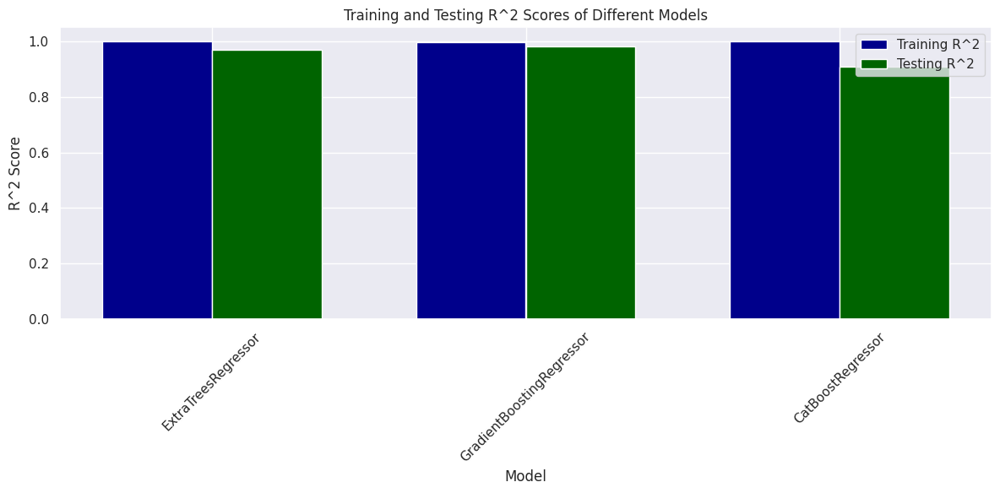

In [48]:
# Define models data
models_data = [
    {
        "name": "ExtraTreesRegressor",
        "train_r2": 1.0,
        "test_r2": 0.9692587907845045
    },
    {
        "name": "GradientBoostingRegressor",
        "train_r2": 0.9972194138304848,
        "test_r2": 0.9802999353850002
    },
    {
        "name": "CatBoostRegressor",
        "train_r2": 0.9998926282440429,
        "test_r2": 0.9094962529656302
    }
]

# Extract model names and corresponding training and testing R^2 scores
model_names = [model["name"] for model in models_data]
train_r2_scores = [model["train_r2"] for model in models_data]
test_r2_scores = [model["test_r2"] for model in models_data]

# Plot both training and testing R^2 scores for each model in a single chart
bar_width = 0.35
index = np.arange(len(model_names))

plt.figure(figsize=(12, 6))

plt.bar(index, train_r2_scores, bar_width, label='Training R^2', color='darkblue')
plt.bar(index + bar_width, test_r2_scores, bar_width, label='Testing R^2', color='darkgreen')

plt.xlabel('Model')
plt.ylabel('R^2 Score')
plt.title('Training and Testing R^2 Scores of Different Models')
plt.xticks(index + bar_width / 2, model_names, rotation=45)
plt.legend()
plt.tight_layout()
plt.show()

ExtraTreesRegressor:
Training R^2 score: 1.0
Testing R^2 score: 0.9692587907845045


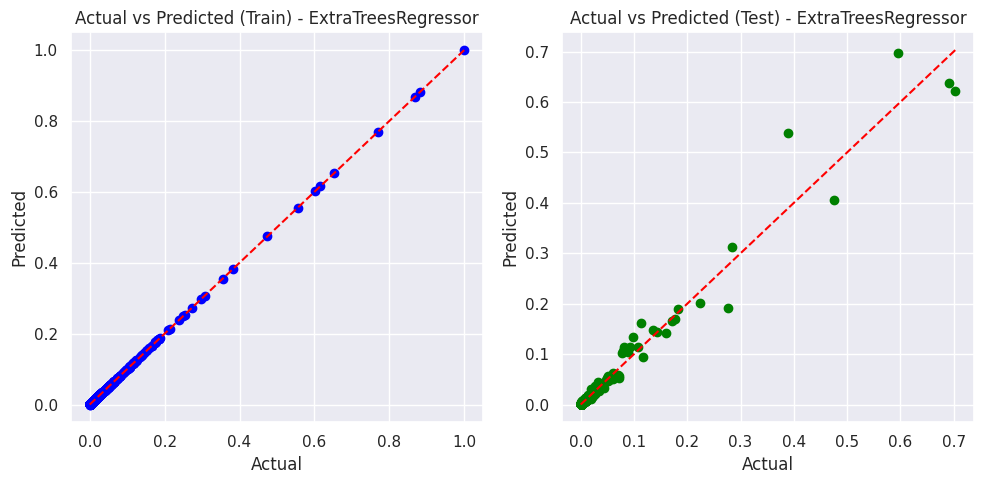

GradientBoostingRegressor:
Training R^2 score: 0.9972194138304848
Testing R^2 score: 0.9802999353850002


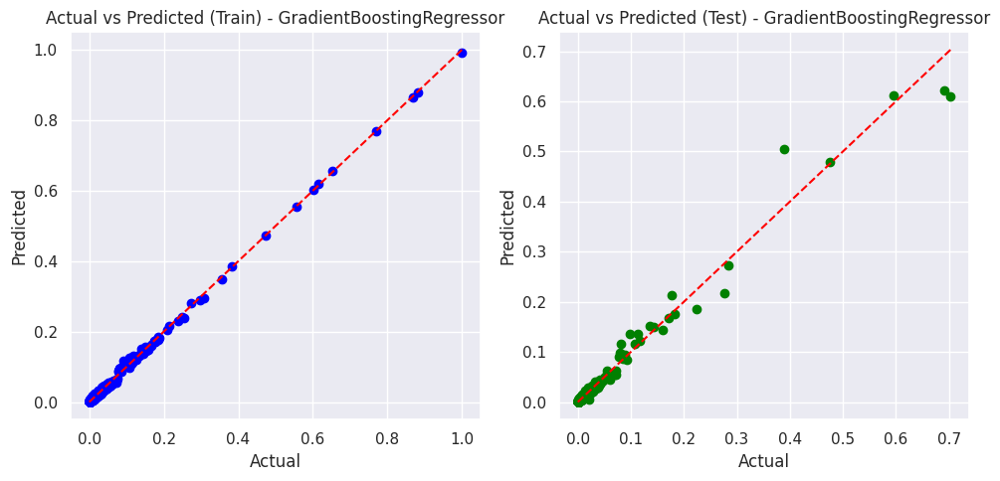

CatBoostRegressor:
Training R^2 score: 0.9998926282440429
Testing R^2 score: 0.9094962529656302


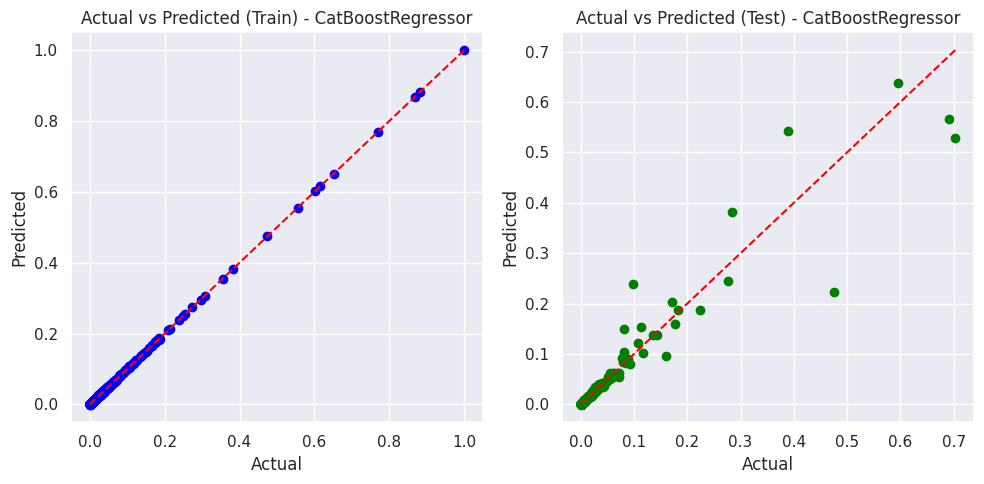

In [49]:
def plot_actual_vs_predicted(model, X_train, X_test, y_train, y_test, model_name):
    # Train the model
    model.fit(X_train, y_train)
    
    # Make predictions on the training and testing data
    train_predictions = model.predict(X_train)
    test_predictions = model.predict(X_test)
    
    # Plot actual vs predicted for train data
    plt.figure(figsize=(10, 5))
    plt.subplot(1, 2, 1)
    plt.scatter(y_train, train_predictions, color='blue')
    plt.plot([min(y_train), max(y_train)], [min(y_train), max(y_train)], '--', color='red')
    plt.xlabel('Actual')
    plt.ylabel('Predicted')
    plt.title('Actual vs Predicted (Train) - ' + model_name)
    
    # Plot actual vs predicted for test data
    plt.subplot(1, 2, 2)
    plt.scatter(y_test, test_predictions, color='green')
    plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], '--', color='red')
    plt.xlabel('Actual')
    plt.ylabel('Predicted')
    plt.title('Actual vs Predicted (Test) - ' + model_name)
    
    plt.tight_layout()
    plt.show()

# Models data
models_data = [
    {
        "name": "ExtraTreesRegressor",
        "train_r2": 1.0,
        "test_r2": 0.9692587907845045
    },
    {
        "name": "GradientBoostingRegressor",
        "train_r2": 0.9972194138304848,
        "test_r2": 0.9802999353850002
    },
    {
        "name": "CatBoostRegressor",
        "train_r2": 0.9998926282440429,
        "test_r2": 0.9094962529656302
    }
]

# Loop through specified models and plot actual vs predicted for train and test data
for model_data in models_data:
    model_name = model_data["name"]
    if model_name == "ExtraTreesRegressor":
        model = ExtraTreesRegressor(random_state=42)
    elif model_name == "GradientBoostingRegressor":
        model = GradientBoostingRegressor(random_state=42)
    elif model_name == "CatBoostRegressor":
        model = CatBoostRegressor(random_state=42, verbose=False)
    
    print(model_name + ":")
    print("Training R^2 score:", model_data["train_r2"])
    print("Testing R^2 score:", model_data["test_r2"])
    
    plot_actual_vs_predicted(model, X_train, X_test, y_train, y_test, model_name)

ExtraTreesRegressor:
Training R^2 score: 1.0
Testing R^2 score: 0.9692587907845045


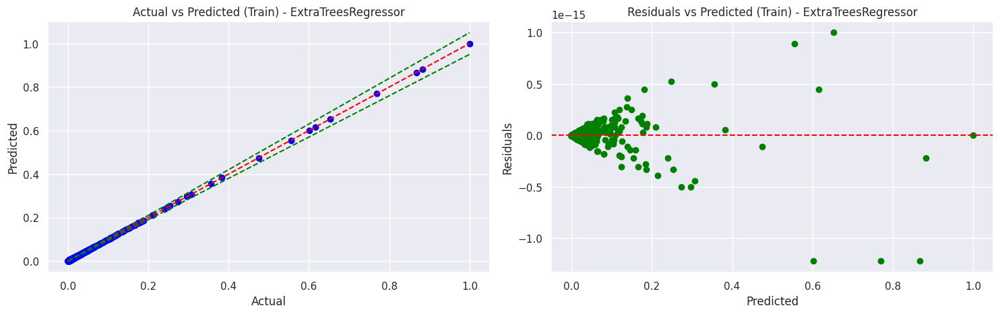

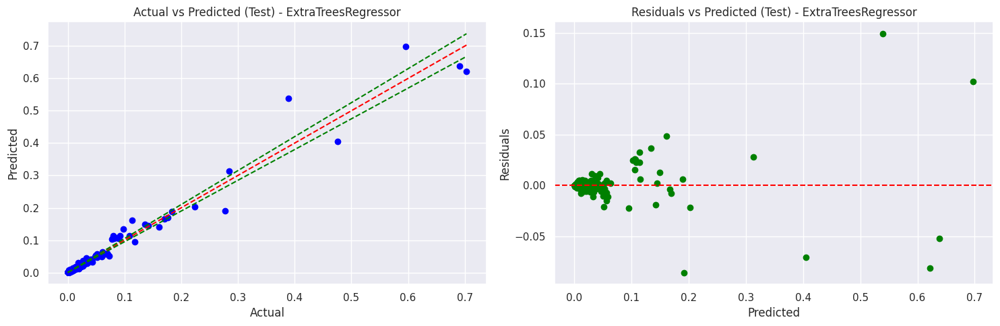

GradientBoostingRegressor:
Training R^2 score: 0.9972194138304848
Testing R^2 score: 0.9802999353850002


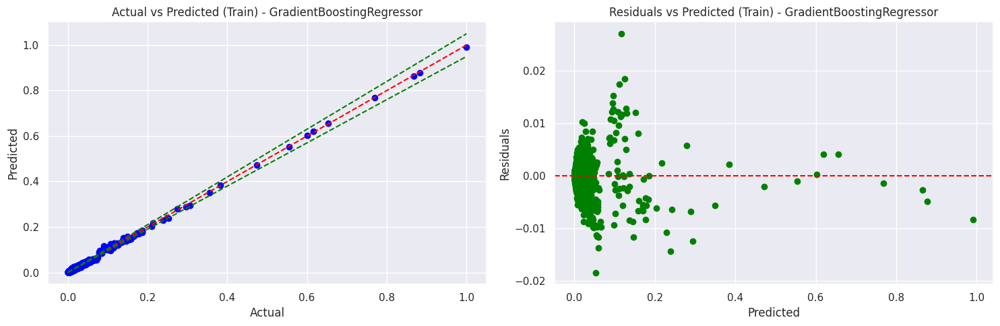

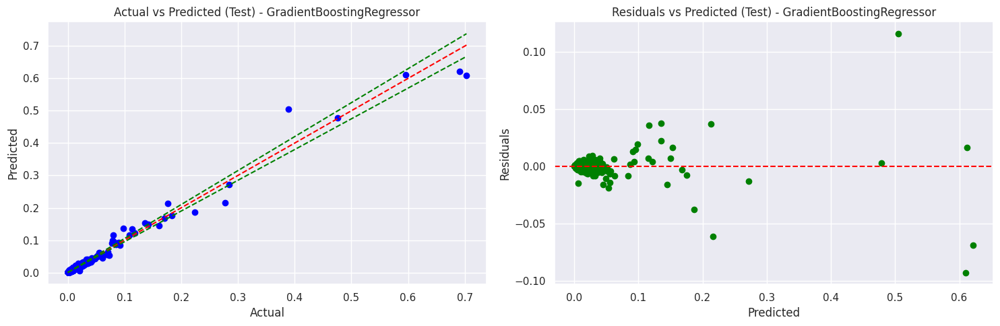

CatBoostRegressor:
Training R^2 score: 0.9998926282440429
Testing R^2 score: 0.9094962529656302


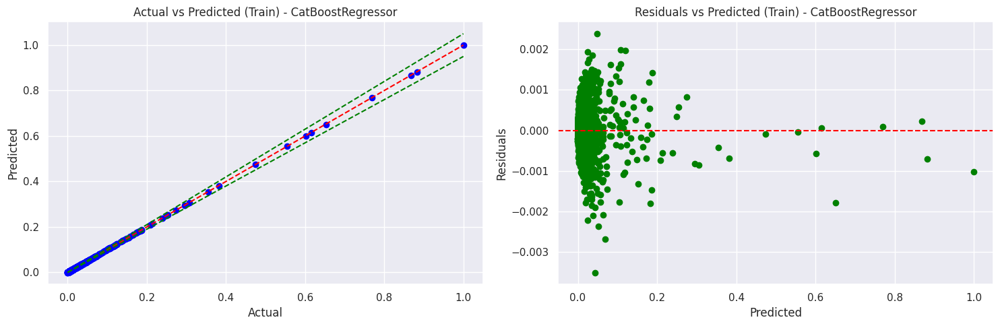

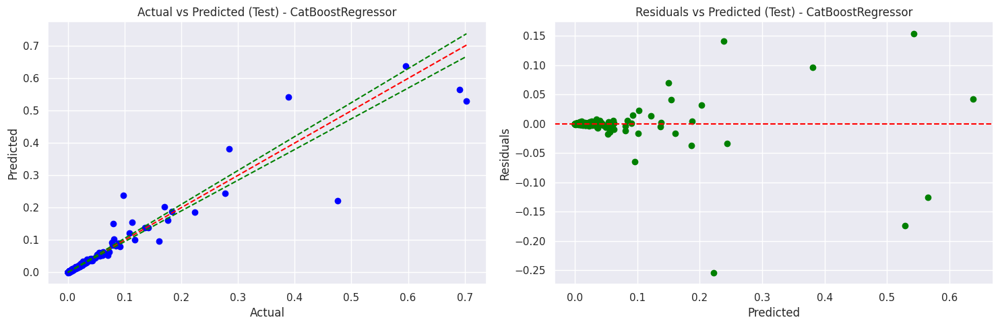

In [50]:
def plot_actual_vs_predicted(model, X_train, X_test, y_train, y_test, model_name):
    # Train the model
    model.fit(X_train, y_train)
    
    # Make predictions on the training and testing data
    train_predictions = model.predict(X_train)
    test_predictions = model.predict(X_test)
    
    # Plot actual vs predicted for train data
    plt.figure(figsize=(15, 5))
    
    plt.subplot(1, 2, 1)
    plt.scatter(y_train, train_predictions, color='blue')
    plt.plot([min(y_train), max(y_train)], [min(y_train), max(y_train)], '--', color='red')
    plt.plot([min(y_train), max(y_train)], [1.05 * min(y_train), 1.05 * max(y_train)], '--', color='green')  # Border line
    plt.plot([min(y_train), max(y_train)], [0.95 * min(y_train), 0.95 * max(y_train)], '--', color='green')  # Border line
    plt.xlabel('Actual')
    plt.ylabel('Predicted')
    plt.title('Actual vs Predicted (Train) - ' + model_name)
    
    plt.subplot(1, 2, 2)
    plt.scatter(train_predictions, train_predictions - y_train, color='green')
    plt.axhline(y=0, color='red', linestyle='--')  # Reference line at y=0
    plt.xlabel('Predicted')
    plt.ylabel('Residuals')
    plt.title('Residuals vs Predicted (Train) - ' + model_name)
    
    plt.tight_layout()
    plt.show()

    # Plot actual vs predicted for test data
    plt.figure(figsize=(15, 5))
    
    plt.subplot(1, 2, 1)
    plt.scatter(y_test, test_predictions, color='blue')
    plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], '--', color='red')
    plt.plot([min(y_test), max(y_test)], [1.05 * min(y_test), 1.05 * max(y_test)], '--', color='green')  # Border line
    plt.plot([min(y_test), max(y_test)], [0.95 * min(y_test), 0.95 * max(y_test)], '--', color='green')  # Border line
    plt.xlabel('Actual')
    plt.ylabel('Predicted')
    plt.title('Actual vs Predicted (Test) - ' + model_name)
    
    plt.subplot(1, 2, 2)
    plt.scatter(test_predictions, test_predictions - y_test, color='green')
    plt.axhline(y=0, color='red', linestyle='--')  # Reference line at y=0
    plt.xlabel('Predicted')
    plt.ylabel('Residuals')
    plt.title('Residuals vs Predicted (Test) - ' + model_name)
    
    plt.tight_layout()
    plt.show()

# Models data
models_data = [
    {
        "name": "ExtraTreesRegressor",
        "train_r2": 1.0,
        "test_r2": 0.9692587907845045
    },
    {
        "name": "GradientBoostingRegressor",
        "train_r2": 0.9972194138304848,
        "test_r2": 0.9802999353850002
    },
    {
        "name": "CatBoostRegressor",
        "train_r2": 0.9998926282440429,
        "test_r2": 0.9094962529656302
    }
]

# Loop through specified models and plot actual vs predicted for train and test data
for model_data in models_data:
    model_name = model_data["name"]
    if model_name == "ExtraTreesRegressor":
        model = ExtraTreesRegressor(random_state=42)
    elif model_name == "GradientBoostingRegressor":
        model = GradientBoostingRegressor(random_state=42)
    elif model_name == "CatBoostRegressor":
        model = CatBoostRegressor(random_state=42, verbose=False)
    
    print(model_name + ":")
    print("Training R^2 score:", model_data["train_r2"])
    print("Testing R^2 score:", model_data["test_r2"])
    
    plot_actual_vs_predicted(model, X_train, X_test, y_train, y_test, model_name)

In [51]:
# Models data
models_data = [
    {
        "name": "ExtraTreesRegressor",
        "train_r2": 1.0,
        "test_r2": 0.9692587907845045
    },
    {
        "name": "GradientBoostingRegressor",
        "train_r2": 0.9972194138304848,
        "test_r2": 0.9802999353850002
    },
    {
        "name": "CatBoostRegressor",
        "train_r2": 0.9998926282440429,
        "test_r2": 0.9094962529656302
    }
]

# Initialize variables to store the best model information
best_model_name = None
best_test_r2_score = -1

# Loop through specified models and plot actual vs predicted for train and test data
for model_data in models_data:
    model_name = model_data["name"]
    train_r2 = model_data["train_r2"]
    test_r2 = model_data["test_r2"]
    
    if test_r2 > best_test_r2_score:
        best_test_r2_score = test_r2
        best_model_name = model_name

# Print the model with the highest testing R^2 score
print("Model with the highest testing R^2 score:", best_model_name)
print("Testing R^2 score:", best_test_r2_score)

Model with the highest testing R^2 score: GradientBoostingRegressor
Testing R^2 score: 0.9802999353850002


In [52]:
# Initialize the GradientBoostingRegressor with the best hyperparameters
best_gb_model = GradientBoostingRegressor(learning_rate=0.1, n_estimators=100, max_depth=5)

# Fit the model on the entire dataset (training + validation)
best_gb_model.fit(X_train, y_train)

# Evaluate the model on the test set
y_pred = best_gb_model.predict(X_test)
test_r2_score = best_gb_model.score(X_test, y_test)
test_mse = mean_squared_error(y_test, y_pred)

print("Testing R^2 score:", test_r2_score)
print("Testing MSE:", test_mse)

Testing R^2 score: 0.9659058053549037
Testing MSE: 2.3770832010502352e-05


In [53]:
# Models data
models_data = [
    {
        "name": "ExtraTreesRegressor",
        "train_r2": 1.0,
        "test_r2": 0.9692587907845045
    },
    {
        "name": "GradientBoostingRegressor",
        "train_r2": 0.9972194138304848,
        "test_r2": 0.9802999353850002
    },
    {
        "name": "CatBoostRegressor",
        "train_r2": 0.9998926282440429,
        "test_r2": 0.9094962529656302
    }
]

# Loop through specified models and plot residuals vs predicted for train and test data
for model_data in models_data:
    model_name = model_data["name"]
    if model_name == "ExtraTreesRegressor":
        model = ExtraTreesRegressor(random_state=42)
    elif model_name == "GradientBoostingRegressor":
        model = GradientBoostingRegressor(random_state=42)
    elif model_name == "CatBoostRegressor":
        model = CatBoostRegressor(random_state=42, verbose=False)
    
    print(model_name + ":")
    print("Training R^2 score:", model_data["train_r2"])
    print("Testing R^2 score:", model_data["test_r2"])

ExtraTreesRegressor:
Training R^2 score: 1.0
Testing R^2 score: 0.9692587907845045
GradientBoostingRegressor:
Training R^2 score: 0.9972194138304848
Testing R^2 score: 0.9802999353850002
CatBoostRegressor:
Training R^2 score: 0.9998926282440429
Testing R^2 score: 0.9094962529656302


# <p><center style="background-color:purple;font-family:Gabriola;color:white;font-size:230%;text-align:center;border-radius:10px 70px;">6️⃣ Improving Model</center></p>

In [54]:
# Split data into features and target variable
X = df.drop('Apple', axis=1)
y = df['Apple']

In [55]:
# Train model and make predictions
model = GradientBoostingRegressor(random_state=42)
model.fit(X_train, y_train)
predictions = model.predict(X_test)

In [56]:
# Evaluate the model
mse = mean_squared_error(y_test, predictions)
r2 = r2_score(y_test, predictions)

In [57]:
print("Mean Squared Error:", mse)
print("R^2 Score:", r2)

Mean Squared Error: 1.346336725343128e-05
R^2 Score: 0.9806896677611411


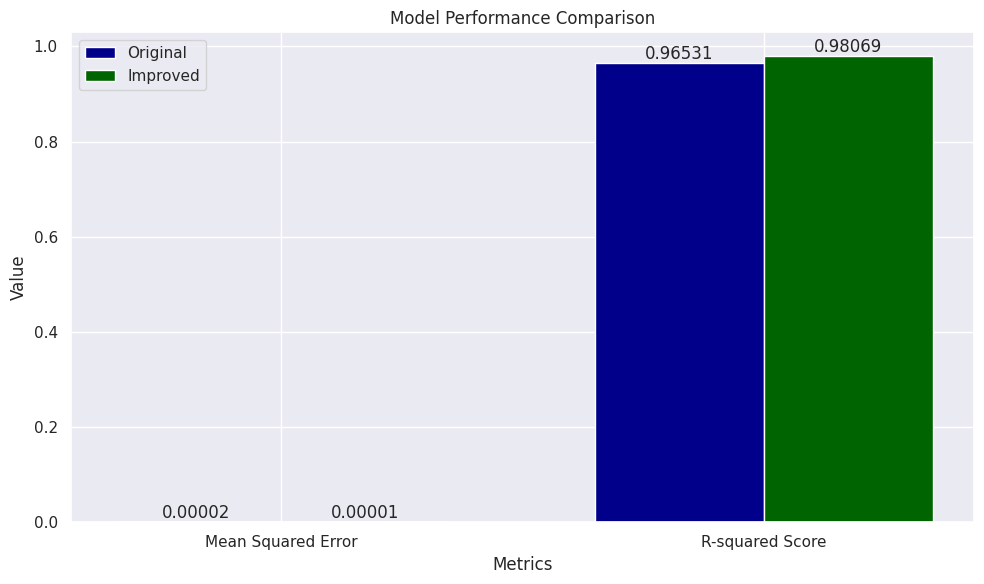

In [58]:
# Original metrics
original_mse = 2.4184313743495906e-05
original_r2 = 0.9653127538924792

# Improved metrics
improved_mse = 1.346336725343128e-05
improved_r2 = 0.9806896677611411

# Data for the chart
metrics = ['Mean Squared Error', 'R-squared Score']
original_values = [original_mse, original_r2]
improved_values = [improved_mse, improved_r2]

# Plotting
plt.figure(figsize=(10, 6))

# Bar width
bar_width = 0.35
index = range(len(metrics))

# Original metrics bars
plt.bar(index, original_values, bar_width, label='Original', color='Darkblue')

# Improved metrics bars
plt.bar([i + bar_width for i in index], improved_values, bar_width, label='Improved', color='Darkgreen')

# Adding labels and title
plt.xlabel('Metrics')
plt.ylabel('Value')
plt.title('Model Performance Comparison')
plt.xticks([i + bar_width/2 for i in index], metrics)
plt.legend()

# Adding text labels
for i in index:
    plt.text(i, original_values[i] + 0.00002, f"{original_values[i]:.5f}", ha='center', va='bottom')
    plt.text(i + bar_width, improved_values[i] + 0.00002, f"{improved_values[i]:.5f}", ha='center', va='bottom')

# Show plot
plt.tight_layout()
plt.show()

### 🔍 Conclusion:

##### The improved version shows a lower Mean Squared Error (MSE) and a higher R-squared (R^2) score compared to the original. Therefore, based on these metrics, the improved version appears to be better than the original.

<br>
<br>
<br>
<br>
<p><center  style="font-family:Gabriola;color:navy;text-align:center; font-size:160%;">🤝🔺We sincerely appreciate your attention, dear viewer, and we hope you found the information provided valuable.<font style="font-family:Gabriola;text-align:center; color:red; font-size: 100%;">PLEASE UPVOTE IF YOU LIKE IT. </font><font style="font-family:Gabriola;color:navy;text-align:center; font-size:100%;">Thank you for your time and engagement.🔺🤝</font>  </center></p>

# <p><center style="background-color:darkred;font-family:Gabriola;color:white;font-size:230%;text-align:center;border-radius:10px 70px;">🔚 THE END 🔚</center></p>